In [ ]:
# This mounts my Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/gdrive/')
# Now that we've mounted the Drive, this ensures that the Python interpreter of the Colab VM can load python files from within it.
import sys
sys.path.append('/content/gdrive/MyDrive/ECE219_tweet_data')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
import os
os.getcwd()
os.chdir('/content/gdrive/MyDrive/ECE219_tweet_data/')

In [ ]:
os.getcwd()

'/content/gdrive/MyDrive/ECE219_tweet_data'

In [ ]:
import json
import datetime
files = ['tweets_#gohawks.txt', 'tweets_#gopatriots.txt', 'tweets_#nfl.txt', 'tweets_#patriots.txt', 'tweets_#sb49.txt', 'tweets_#superbowl.txt']
for file in files:
  tweet_times = []
  tweet_count = 0
  follower_count = 0
  retweet_count = 0
  with open(file) as f:
      for line in f:
        json_object = json.loads(line)
        tweet_times.append(json_object['citation_date'])
        retweet_count += json_object['metrics']['citations']['total']
        follower_count += json_object['author']['followers']
        tweet_count += 1
      print(file)
      print("The average number of tweets per hour for %s is %s" %(file, str(tweet_count/((max(tweet_times)-min(tweet_times))/3600))))
      print("The average number of followers of users posting the tweets per tweet for %s is %s" %(file, str(follower_count / tweet_count)))
      print("The average number of retweets per tweet for %s is %s" %(file,str(retweet_count / tweet_count)))
      print("*"*100)

tweets_#gohawks.txt
The average number of tweets per hour for tweets_#gohawks.txt is 292.48785062173687
The average number of followers of users posting the tweets per tweet for tweets_#gohawks.txt is 2217.9237355281984
The average number of retweets per tweet for tweets_#gohawks.txt is 2.0132093991319877
****************************************************************************************************
tweets_#gopatriots.txt
The average number of tweets per hour for tweets_#gopatriots.txt is 40.95469800606194
The average number of followers of users posting the tweets per tweet for tweets_#gopatriots.txt is 1427.2526051635405
The average number of retweets per tweet for tweets_#gopatriots.txt is 1.4081919101697078
****************************************************************************************************
tweets_#nfl.txt
The average number of tweets per hour for tweets_#nfl.txt is 397.0213901819841
The average number of followers of users posting the tweets per tweet for twee

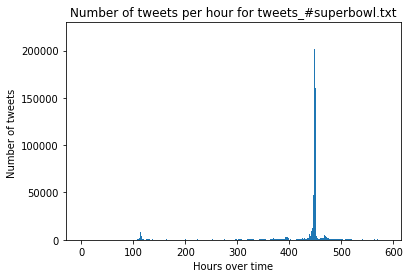

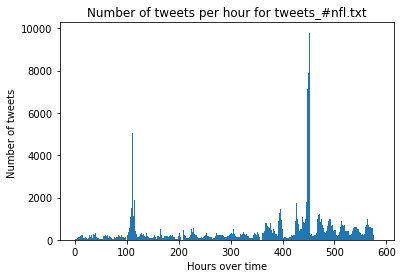

In [ ]:
import matplotlib.pyplot as plt
import math
files = ['tweets_#superbowl.txt', 'tweets_#nfl.txt']
for file in files:
  tweet_times = []
  with open(file) as f:
      for line in f:
        json_object = json.loads(line)
        tweet_times.append(json_object['citation_date'])
      b = min(tweet_times)
      tweet_times =  [(x - b)/3600 for x in tweet_times]
      plt.hist(tweet_times, bins=range(0, math.ceil(max(tweet_times)), 1))
      plt.title('Number of tweets per hour for '+ file)
      plt.ylabel('Number of tweets ')
      plt.xlabel('Hours over time')
      plt.show()

**Exploratory data analysis**

Looking at the top repeated words in each hashtag, then look at the distribution of different words at different times of the game.

In [ ]:
import pytz
import datetime
import matplotlib.pyplot as plt
import math
import json

pst_tz = pytz.timezone('America/Los_Angeles')
files = ['tweets_#superbowl.txt', 'tweets_#nfl.txt', 'tweets_#gopatriots.txt', 'tweets_#patriots.txt', 'tweets_#sb49.txt', 'tweets_#gohawks.txt']
tweet_times = {}
tweet_text = {}
retweet_count = {}
follower_count = {}
for file in files:
  tweet_times[file] = []
  tweet_text[file] = []
  retweet_count[file] = []
  follower_count[file]=[]
  with open(file) as f:
      for line in f:
        json_object = json.loads(line)
        tweet_times[file].append(datetime.datetime.fromtimestamp(json_object['citation_date'], pst_tz))
        tweet_text[file].append(json_object['title'])
        retweet_count[file].append(json_object['metrics']['citations']['total'])
        follower_count[file].append(json_object['author']['followers'])

In [ ]:
with open(files[0],'r') as f:
   line1=f.readline()
   json_obj=json.loads(line1)
   for key in json_obj:
     print(key)
   print("*"*50)
   for key in json_obj:
     print(key+":",json_obj[key])
     print("*"*50)

firstpost_date
title
url
tweet
author
original_author
citation_date
metrics
highlight
type
citation_url
**************************************************
firstpost_date: 1419883838
**************************************************
title: At http://t.co/Vd0RWOeAed -- #Seahawks #12thMAN #12 #SeahawkNation #SuperBowlBound #Superbowl #Repeat #GoHawks ... http://t.co/XSEFUKqEhN
**************************************************
url: http://twitter.com/HawksNationYes/status/549658771749101568
**************************************************
tweet: {'contributors': None, 'truncated': False, 'text': 'At http://t.co/Vd0RWOeAed -- #Seahawks #12thMAN #12 #SeahawkNation #SuperBowlBound #Superbowl #Repeat #GoHawks ... http://t.co/XSEFUKqEhN', 'in_reply_to_status_id': None, 'id': 549658771749101568, 'favorite_count': 0, 'source': '<a href="http://ifttt.com" rel="nofollow">IFTTT</a>', 'retweeted': False, 'coordinates': None, 'timestamp_ms': '1419883838008', 'entities': {'symbols': [], 'media': [{

In [ ]:
json.loads(line)

{'firstpost_date': 1423304269,
 'title': "The ultimate broken hearted hangover week from hell (#SB49) is almost over. Listening to the blues still. We'll get'em in #SB50 #GOHAWKS",
 'url': 'http://twitter.com/carabear133/status/564005099874181122',
 'tweet': {'contributors': None,
  'truncated': False,
  'text': "The ultimate broken hearted hangover week from hell (#SB49) is almost over. Listening to the blues still. We'll get'em in #SB50 #GOHAWKS",
  'in_reply_to_status_id': None,
  'id': 564005099874181122,
  'favorite_count': 0,
  'source': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
  'retweeted': False,
  'coordinates': None,
  'timestamp_ms': '1423304269175',
  'entities': {'symbols': [],
   'user_mentions': [],
   'trends': [],
   'hashtags': [{'indices': [53, 58], 'text': 'SB49'},
    {'indices': [122, 127], 'text': 'SB50'},
    {'indices': [128, 136], 'text': 'GOHAWKS'}],
   'urls': []},
  'in_reply_to_screen_name': None,
  'in_reply_to_user_id': None

In [ ]:
def cleaning(text_list):
  def clean(text):
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    texter = re.sub(r"<br />", " ", text)
    texter = re.sub(r"&quot;", "\"",texter)
    texter = re.sub('&#39;', "\"", texter)
    texter = re.sub('\n', " ", texter)
    texter = re.sub(' u '," you ", texter)
    texter = re.sub('`',"", texter)
    texter = re.sub(' +', ' ', texter)
    texter = re.sub(r"(!)\1+", r"!", texter)
    texter = re.sub(r"(\?)\1+", r"?", texter)
    texter = re.sub('&amp;', 'and', texter)
    texter = re.sub('\r', ' ',texter)
    clean = re.compile('<.*?>')
    texter = texter.encode('ascii', 'ignore').decode('ascii')
    texter = re.sub(clean, '', texter)
    if texter == "":
      texter = ""
    return texter

  for i in range(len(text_list)):
    text_list[i]=clean(str(text_list[i]))

  # exclude terms with numbers/punctuation
  import string
  for i in range (0,len(text_list)):
    sent=[i for i in text_list[i] if not i.isdigit()]
    sent = [i for i in text_list[i] if i not in string.punctuation]
    text_list[i]= "".join(sent)
  return text_list

In [ ]:
#performing Lemmatization
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from nltk import word_tokenize
from nltk.corpus import wordnet
import nltk
nltk.download('all')
lemmatizer = WordNetLemmatizer()

def penn2morphy(penntag):
    morphy_tag = {'NN':'n', 'JJ':'a','VB':'v', 'RB':'r'}
    try:
        return morphy_tag[penntag[:2]]
    except:
        return 'n'

def lemmatize_sent(text):
    return [lemmatizer.lemmatize(word.lower(), pos=penn2morphy(tag)) for word, tag in pos_tag(nltk.word_tokenize(text))]      
    

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping grammars/basque_grammars.zip.
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   U

In [ ]:
def lemmatizing(text_list):
  for i in range (0,len(text_list)):
    text_list[i]=" ".join(lemmatize_sent(text_list[i]))
  return text_list

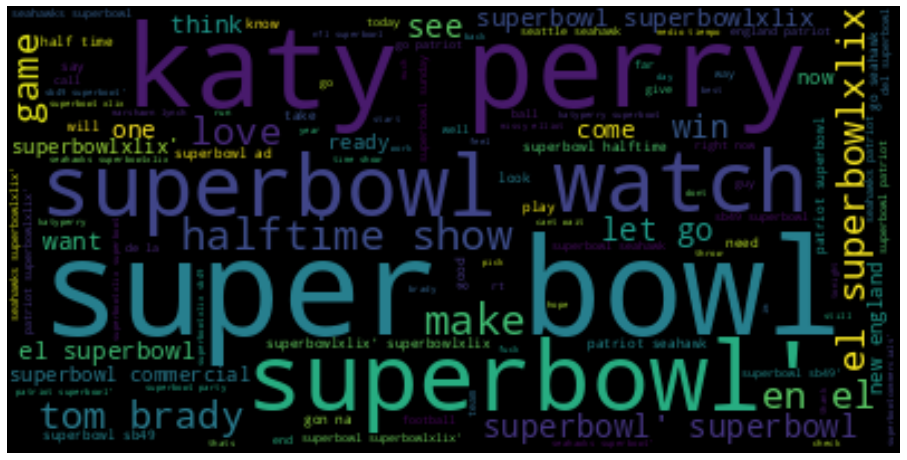

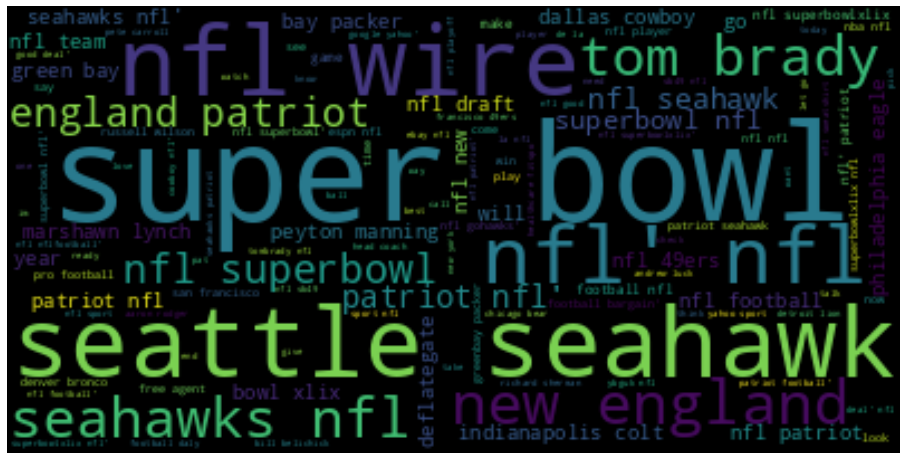

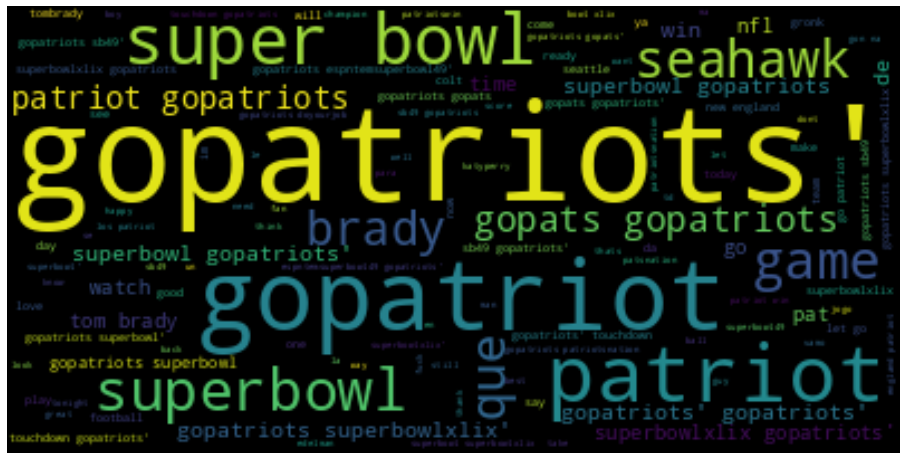

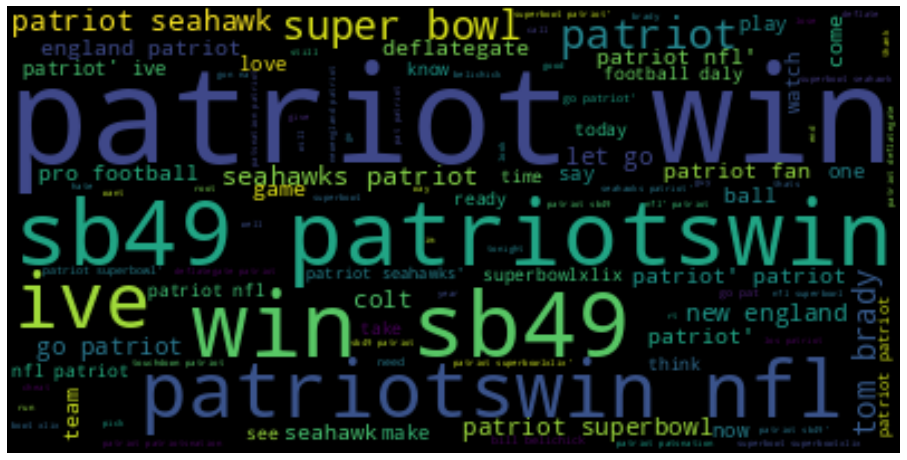

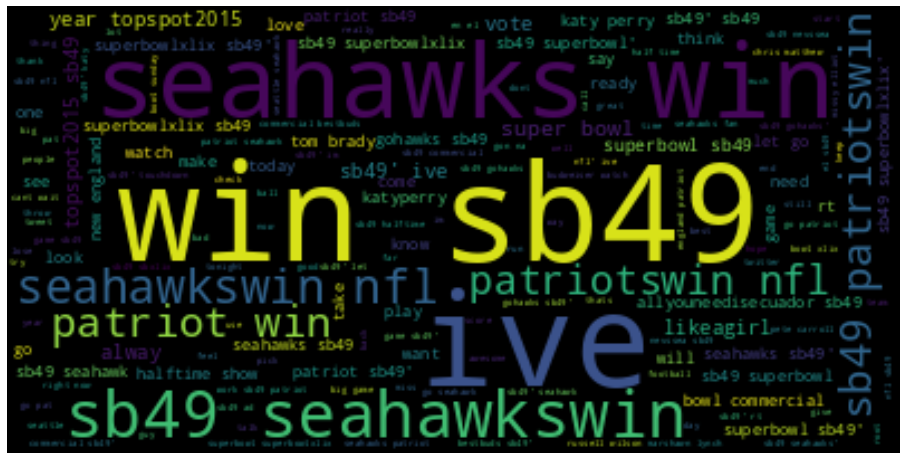

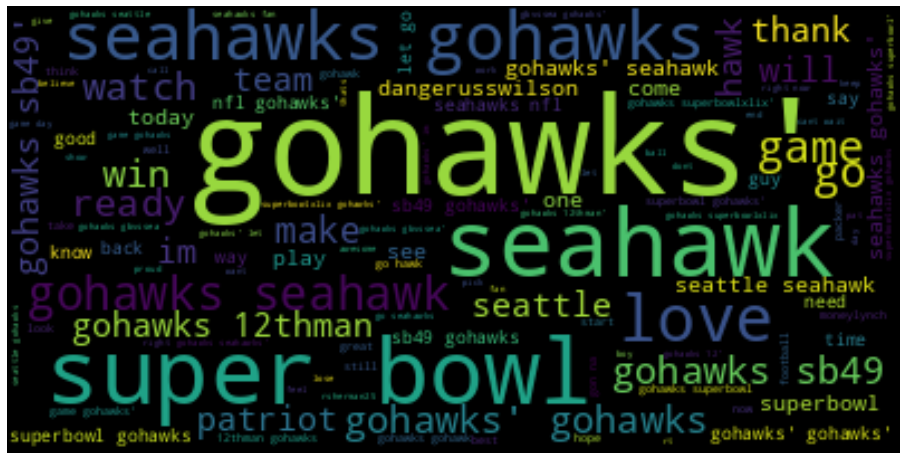

In [ ]:
from wordcloud import WordCloud,STOPWORDS
import re
lemmatized_text={}
cleaned_text={}
for file in files:
  cleaned_text[file] = cleaning(tweet_text[file])
  unique_string=("").join(str(cleaned_text[file]))
  lemmatized_text[file] = lemmatizing(cleaned_text[file])
  lem_string=("").join(str(lemmatized_text[file]))
  stop_words = ["a", "b", "c", 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z'] + list(STOPWORDS)
  wordcloud = WordCloud(max_font_size=60, stopwords = stop_words).generate(lem_string)
  plt.figure(figsize=(16,12))
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()

In [ ]:
lem_string


"['i lt3 our defense gohawks httptcou1pcxpesr8', 'twelfth dog be ready gohawks dogslife httptcogd3v6vqps5', 'oh no big deal just nfc west champ and the number 1 seed again seahawks gohawks 12 httptco7nigojtpz2', 'at httptcovd0rwoeaed seahawks 12thman 12 seahawknation superbowlbound superbowl repeat gohawks httptcoxsefukqehn', 'good luck at michigan jim harbaugh gohawks httptcoghpshhrnon', 'fivethirtyeight gohawks keep your eye on the ball peyton httptcotfpaqqqcin', 'one of my favorite hawk logos that go around this year gohawks seahawklove soshiny httptcouclozxnvdz', 'happy new year everyone here to a 2015 full of new opportunity gohawks seahawks newyearnewring 12thman httptcopg7flsm3wy', 'my hometown gohawks wanderlustpics seattle washington usa httptcod4gyi64rdl', 'absolutely gohawks httptco2yhpepfzyn', '12 seahawks be the champion 247 tgibf whynotusagain gohawks httptcopietdmissc', 'if they pass on you pass on them gohawks httptco2nyjokqs2o', 'at httptcovd0rwoeaed serve me up some h

In [ ]:
from nltk.tokenize import word_tokenize
  
word_tokens = word_tokenize(lem_string)

filtered_sentence = []  
for w in word_tokens:
    if w not in stop_words:
        filtered_sentence.append(w)
  
print(filtered_sentence)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
s=[]
for file in files: 
  print(len(tweet_text[file]),len(tweet_times[file]),len(retweet_count[file]),len(follower_count[file]))
  s.append(len(lemmatized_text[file]))
print(s)

1213813 1213813 1213813 1213813
233022 233022 233022 233022
23511 23511 23511 23511
440621 440621 440621 440621
743649 743649 743649 743649
169122 169122 169122 169122
[1213813, 233022, 23511, 440621, 743649, 169122]


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
dict_file={}
for file in files: 
   key=file
   df = pd.DataFrame(list(zip(lemmatized_text[file],tweet_times[file],retweet_count[file],follower_count[file])), columns =['Tweet_text', 'time','retweets','followers']) 
   dict_file[key]=df

In [ ]:
for i in range(6): 
   print(dict_file[files[i]])

                                                Tweet_text  \
0        at httptcovd0rwoeaed seahawks 12thman 12 seaha...   
1        you be 12ed pas it on seahawknation lob superb...   
2        27 day to the superbowl katyperry katycats sup...   
3        check out the cool event that budlight have pl...   
4        lenny kravitz acompaar a katy perry en el half...   
...                                                    ...   
1213808  look at this crazy map of all the private jet ...   
1213809  where to start make money online for beginner ...   
1213810  still in superbowl mode sb49 superbowl gronkna...   
1213811  pscgt2015 nice debbie futieton sb49 phx happyt...   
1213812  are you still celebrate the superbowl win sb49...   

                             time  retweets  followers  
0       2015-01-16 20:21:37-08:00         2       22.0  
1       2015-01-16 20:06:19-08:00        15       22.0  
2       2015-01-14 12:22:37-08:00         2      858.0  
3       2015-01-14 10:48:18

In [ ]:
tweet_texts=[]
tweet_time = []
retweet_counts = []
follower_counts = []

for file in files: 
  tweet_texts=tweet_texts+lemmatized_text[file]
  tweet_time = tweet_time+tweet_times[file]
  retweet_counts =retweet_counts+retweet_count[file]
  follower_counts = follower_counts+follower_count[file] 

print(len(tweet_texts),len(tweet_time),len(retweet_counts),len(follower_counts))

2823738 2823738 2823738 2823738


In [ ]:
tweet_data=pd.DataFrame(list(zip(tweet_texts,tweet_time,retweet_counts,follower_counts)), columns =['Tweet_text', 'time','retweets','followers']) 
tweet_data.info()
tweet_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2823738 entries, 0 to 2823737
Data columns (total 4 columns):
 #   Column      Dtype                              
---  ------      -----                              
 0   Tweet_text  object                             
 1   time        datetime64[ns, America/Los_Angeles]
 2   retweets    int64                              
 3   followers   float64                            
dtypes: datetime64[ns, America/Los_Angeles](1), float64(1), int64(1), object(1)
memory usage: 86.2+ MB


,Tweet_text,time,retweets,followers
0,At http://t.co/Vd0RWOeAed -- #Seahawks #12thMA...,2015-01-16 20:21:37-08:00,2,22.0
1,You been 12ed pass it on #SeahawkNation #LOB #...,2015-01-16 20:06:19-08:00,15,22.0
2,27 days to the SuperBowl 🏈🏈\n#Katyperry #KatyC...,2015-01-14 12:22:37-08:00,2,858.0
3,Check out the cool event that #budlight has p...,2015-01-14 10:48:18-08:00,2,14335.0
4,Lenny Kravitz acompañará a Katy Perry en el #H...,2015-01-15 02:00:31-08:00,7,1143.0


In [ ]:
for file in files:
  print(file,"max time",max(tweet_times[file]),"min time",min(tweet_times[file]))

tweets_#superbowl.txt max time 2015-02-07 10:00:08-08:00 min time 2015-01-14 00:13:07-08:00
tweets_#nfl.txt max time 2015-02-07 10:55:36-08:00 min time 2015-01-14 00:00:04-08:00
tweets_#gopatriots.txt max time 2015-02-06 23:54:35-08:00 min time 2015-01-14 01:50:11-08:00
tweets_#patriots.txt max time 2015-02-07 10:55:00-08:00 min time 2015-01-14 00:07:18-08:00
tweets_#sb49.txt max time 2015-02-07 10:55:36-08:00 min time 2015-01-14 04:31:15-08:00
tweets_#gohawks.txt max time 2015-02-07 02:17:49-08:00 min time 2015-01-14 00:04:41-08:00


In [ ]:
pip install nfl_data_py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import nfl_data_py as nfl

In [ ]:
nfl.see_pbp_cols()

Index(['play_id', 'game_id', 'old_game_id', 'home_team', 'away_team',
       'season_type', 'week', 'posteam', 'posteam_type', 'defteam',
       ...
       'out_of_bounds', 'home_opening_kickoff', 'qb_epa', 'xyac_epa',
       'xyac_mean_yardage', 'xyac_median_yardage', 'xyac_success', 'xyac_fd',
       'xpass', 'pass_oe'],
      dtype='object', length=372)

In [ ]:
nfl_2014=[]
nfl_2014=nfl.import_pbp_data([2014])

2014 done.
Downcasting floats.


In [ ]:
pd.set_option('display.max_columns', None)
nfl_2014.head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [ ]:
nfl.see_weekly_cols()

Index(['player_id', 'player_name', 'player_display_name', 'position',
       'position_group', 'headshot_url', 'recent_team', 'season', 'week',
       'season_type', 'completions', 'attempts', 'passing_yards',
       'passing_tds', 'interceptions', 'sacks', 'sack_yards', 'sack_fumbles',
       'sack_fumbles_lost', 'passing_air_yards', 'passing_yards_after_catch',
       'passing_first_downs', 'passing_epa', 'passing_2pt_conversions', 'pacr',
       'dakota', 'carries', 'rushing_yards', 'rushing_tds', 'rushing_fumbles',
       'rushing_fumbles_lost', 'rushing_first_downs', 'rushing_epa',
       'rushing_2pt_conversions', 'receptions', 'targets', 'receiving_yards',
       'receiving_tds', 'receiving_fumbles', 'receiving_fumbles_lost',
       'receiving_air_yards', 'receiving_yards_after_catch',
       'receiving_first_downs', 'receiving_epa', 'receiving_2pt_conversions',
       'racr', 'target_share', 'air_yards_share', 'wopr', 'special_teams_tds',
       'fantasy_points', 'fantasy_point

In [ ]:
nfl_wk=nfl.import_weekly_data([2014])
nfl_wk.head()

Downcasting floats.


,player_id,player_name,player_display_name,position,position_group,headshot_url,recent_team,season,week,season_type,completions,attempts,passing_yards,passing_tds,interceptions,sacks,sack_yards,sack_fumbles,sack_fumbles_lost,passing_air_yards,passing_yards_after_catch,passing_first_downs,passing_epa,passing_2pt_conversions,pacr,dakota,carries,rushing_yards,rushing_tds,rushing_fumbles,rushing_fumbles_lost,rushing_first_downs,rushing_epa,rushing_2pt_conversions,receptions,targets,receiving_yards,receiving_tds,receiving_fumbles,receiving_fumbles_lost,receiving_air_yards,receiving_yards_after_catch,receiving_first_downs,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share,wopr,special_teams_tds,fantasy_points,fantasy_points_ppr
0,00-0007091,None,Matt Hasselbeck,QB,QB,https://static.www.nfl.com/image/private/f_aut...,IND,2014,3,REG,2,4,20.0,0,0.0,0.0,-0.0,0,0,44.0,17.0,1.0,-0.474654,0,0.454545,NaN,1,-1.0,0,0.0,0.0,0.0,0.00000,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,0.700000,0.700000
1,00-0007091,None,Matt Hasselbeck,QB,QB,https://static.www.nfl.com/image/private/f_aut...,IND,2014,4,REG,0,0,0.0,0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,NaN,0,NaN,NaN,3,-2.0,0,0.0,0.0,0.0,-3.44782,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,-0.200000,-0.200000
2,00-0007091,None,Matt Hasselbeck,QB,QB,https://static.www.nfl.com/image/private/f_aut...,IND,2014,16,REG,15,21,126.0,1,0.0,2.0,7.0,1,1,123.0,76.0,9.0,-7.477477,0,1.024390,0.090931,0,0.0,0,0.0,0.0,0.0,NaN,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,7.040000,7.040000
3,00-0007091,None,Matt Hasselbeck,QB,QB,https://static.www.nfl.com/image/private/f_aut...,IND,2014,17,REG,13,19,155.0,1,0.0,0.0,-0.0,0,0,146.0,89.0,7.0,7.324080,0,1.061644,0.213295,4,-8.0,0,0.0,0.0,0.0,-4.30916,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,9.400000,9.400000
4,00-0010346,None,Peyton Manning,QB,QB,https://static.www.nfl.com/image/private/f_aut...,DEN,2014,1,REG,22,36,269.0,3,0.0,1.0,10.0,0,0,307.0,123.0,13.0,13.139215,0,0.876221,0.166709,4,-3.0,0,0.0,0.0,0.0,0.00000,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,22.459999,22.459999


In [ ]:
nfl_player=nfl.import_rosters([2014])
nfl_player.head()

,season,team,position,depth_chart_position,jersey_number,status,player_name,first_name,last_name,birth_date,height,weight,college,player_id,espn_id,sportradar_id,yahoo_id,rotowire_id,pff_id,pfr_id,fantasy_data_id,sleeper_id,years_exp,headshot_url,ngs_position,week,game_type,status_description_abbr,football_name,esb_id,gsis_it_id,smart_id,entry_year,rookie_year,draft_club,draft_number
0,2014,ARZ,C,None,63,Active,Lyle Sendlein,Lyle,Sendlein,1984-03-16,75,308.0,Texas,00-0025682,None,None,None,None,None,None,None,None,7,https://static.www.nfl.com/image/private/f_aut...,None,18,WC,A01,Lyle,SEN108904,NaN,NaN,2007,2007,None,None
1,2014,ARZ,CB,None,28,Active,Justin Bethel,Justin,Bethel,1990-06-17,72,190.0,Presbyterian,00-0029530,15089,f403d099-29d4-43cd-bf79-4aeeb8dc6cd3,25887,8306,7654,BethJu00,14469,1216,2,https://static.www.nfl.com/image/private/f_aut...,None,18,WC,A01,Justin,BET201235,NaN,NaN,2012,2012,ARZ,27
2,2014,ARZ,CB,None,31,Active,Antonio Cromartie,Antonio,Cromartie,1984-04-15,74,210.0,None,00-0024234,None,None,None,None,None,None,None,None,8,https://static.www.nfl.com/image/private/f_aut...,None,18,WC,A01,Antonio,CRO161100,NaN,NaN,2006,2006,SD,201
3,2014,ARZ,CB,None,21,Active,Patrick Peterson,Patrick,Peterson,1990-07-11,73,219.0,Louisiana State,00-0027943,13980,9f3b934e-52d6-4e16-ae92-d3e60be10493,24792,7300,6157,PetePa00,13415,972,3,https://static.www.nfl.com/image/private/f_aut...,None,18,WC,A01,Patrick,PET415511,NaN,NaN,2011,2011,None,None
4,2014,ARZ,CB,None,25,Active,Jerraud Powers,Courtney,Powers,1987-07-19,70,187.0,Auburn,00-0027064,None,None,None,None,None,None,None,None,5,https://static.www.nfl.com/image/private/f_aut...,None,18,WC,A01,Jerraud,POW641973,NaN,NaN,2009,2009,None,None


In [ ]:
nfl_team= nfl.import_team_desc()
nfl_team.head()

,team_abbr,team_name,team_id,team_nick,team_conf,team_division,team_color,team_color2,team_color3,team_color4,team_logo_wikipedia,team_logo_espn,team_wordmark,team_conference_logo,team_league_logo,team_logo_squared
0,ARI,Arizona Cardinals,3800,Cardinals,NFC,NFC West,#97233F,#000000,#ffb612,#a5acaf,https://upload.wikimedia.org/wikipedia/en/thum...,https://a.espncdn.com/i/teamlogos/nfl/500/ari.png,https://github.com/nflverse/nflverse-pbp/raw/m...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://raw.githubusercontent.com/nflverse/nfl...,https://github.com/nflverse/nflverse-pbp/raw/m...
1,ATL,Atlanta Falcons,200,Falcons,NFC,NFC South,#A71930,#000000,#a5acaf,#a30d2d,https://upload.wikimedia.org/wikipedia/en/thum...,https://a.espncdn.com/i/teamlogos/nfl/500/atl.png,https://github.com/nflverse/nflverse-pbp/raw/m...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://raw.githubusercontent.com/nflverse/nfl...,https://github.com/nflverse/nflverse-pbp/raw/m...
2,BAL,Baltimore Ravens,325,Ravens,AFC,AFC North,#241773,#9E7C0C,#9e7c0c,#c60c30,https://upload.wikimedia.org/wikipedia/en/thum...,https://a.espncdn.com/i/teamlogos/nfl/500/bal.png,https://github.com/nflverse/nflverse-pbp/raw/m...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://raw.githubusercontent.com/nflverse/nfl...,https://github.com/nflverse/nflverse-pbp/raw/m...
3,BUF,Buffalo Bills,610,Bills,AFC,AFC East,#00338D,#C60C30,#0c2e82,#d50a0a,https://upload.wikimedia.org/wikipedia/en/thum...,https://a.espncdn.com/i/teamlogos/nfl/500/buf.png,https://github.com/nflverse/nflverse-pbp/raw/m...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://raw.githubusercontent.com/nflverse/nfl...,https://github.com/nflverse/nflverse-pbp/raw/m...
4,CAR,Carolina Panthers,750,Panthers,NFC,NFC South,#0085CA,#000000,#bfc0bf,#0085ca,https://upload.wikimedia.org/wikipedia/en/thum...,https://a.espncdn.com/i/teamlogos/nfl/500-dark...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://github.com/nflverse/nflverse-pbp/raw/m...,https://raw.githubusercontent.com/nflverse/nfl...,https://github.com/nflverse/nflverse-pbp/raw/m...


In [ ]:
pd.unique(nfl_team[['team_abbr','team_nick']].values.ravel())

array(['ARI', 'Cardinals', 'ATL', 'Falcons', 'BAL', 'Ravens', 'BUF',
       'Bills', 'CAR', 'Panthers', 'CHI', 'Bears', 'CIN', 'Bengals',
       'CLE', 'Browns', 'DAL', 'Cowboys', 'DEN', 'Broncos', 'DET',
       'Lions', 'GB', 'Packers', 'HOU', 'Texans', 'IND', 'Colts', 'JAX',
       'Jaguars', 'KC', 'Chiefs', 'LA', 'Rams', 'LAC', 'Chargers', 'LAR',
       'LV', 'Raiders', 'MIA', 'Dolphins', 'MIN', 'Vikings', 'NE',
       'Patriots', 'NO', 'Saints', 'NYG', 'Giants', 'NYJ', 'Jets', 'OAK',
       'PHI', 'Eagles', 'PIT', 'Steelers', 'SD', 'SEA', 'Seahawks', 'SF',
       '49ers', 'STL', 'TB', 'Buccaneers', 'TEN', 'Titans', 'WAS',
       'Commanders'], dtype=object)

In [ ]:
pd.unique(nfl_player[['team']].values.ravel())

array(['ARZ', 'ATL', 'BLT', 'BUF', 'CAR', 'CHI', 'CIN', 'CLV', 'DAL',
       'DEN', 'DET', 'GB', 'HST', 'IND', 'JAX', 'KC', 'LV', 'MIA', 'MIN',
       'NE', 'NO', 'NYG', 'NYJ', 'PHI', 'PIT', 'SD', 'SEA', 'SF', 'SL',
       'TB', 'TEN', 'WAS'], dtype=object)

In [ ]:
pd.unique(nfl_2014[['game_date']].values.ravel())

array(['2014-09-07', '2014-09-04', '2014-09-08', '2014-09-14',
       '2014-09-15', '2014-09-11', '2014-09-21', '2014-09-22',
       '2014-09-18', '2014-09-28', '2014-09-29', '2014-09-25',
       '2014-10-05', '2014-10-02', '2014-10-06', '2014-10-12',
       '2014-10-09', '2014-10-13', '2014-10-19', '2014-10-20',
       '2014-10-16', '2014-10-26', '2014-10-23', '2014-10-27',
       '2014-11-02', '2014-11-03', '2014-10-30', '2014-11-09',
       '2014-11-10', '2014-11-06', '2014-11-16', '2014-11-13',
       '2014-11-17', '2014-11-23', '2014-11-24', '2014-11-20',
       '2014-11-30', '2014-11-27', '2014-12-01', '2014-12-08',
       '2014-12-07', '2014-12-04', '2014-12-11', '2014-12-14',
       '2014-12-15', '2014-12-21', '2014-12-22', '2014-12-20',
       '2014-12-18', '2014-12-28', '2015-01-03', '2015-01-04',
       '2015-01-10', '2015-01-11', '2015-01-18', '2015-02-01'],
      dtype=object)

In [ ]:
superbowl=nfl_2014[nfl_2014['game_date']=='2015-02-01']
superbowl.head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [ ]:
superbowl.describe()

,play_id,week,yardline_100,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,quarter_end,drive,sp,qtr,down,goal_to_go,ydstogo,ydsnet,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,air_yards,yards_after_catch,kick_distance,home_timeouts_remaining,away_timeouts_remaining,timeout,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passing_yards,receiving_yards,rushing_yards,lateral_receiving_yards,lateral_rushing_yards,tackle_with_assist,fumble_recovery_1_yards,fumble_recovery_2_yards,return_yards,penalty_yards,replay_or_challenge,defensive_two_point_attempt,defensive_two_point_conv,defensive_extra_point_attempt,defensive_extra_point_conv,season,cp,cpoe,series,series_success,order_sequence,play_deleted,special_teams_play,fixed_drive,drive_play_count,drive_first_downs,drive_inside20,drive_ended_with_score,drive_quarter_start,drive_quarter_end,drive_yards_penalized,drive_play_id_started,drive_play_id_ended,away_score,home_score,result,total,spread_line,total_line,div_game,temp,wind,aborted_play,success,passer_jersey_number,rusher_jersey_number,receiver_jersey_number,pass,rush,first_down,special,play,jersey_number,out_of_bounds,home_opening_kickoff,qb_epa,xyac_epa,xyac_mean_yardage,xyac_median_yardage,xyac_success,xyac_fd,xpass,pass_oe
count,192.000000,192.0,158.000000,192.000000,192.000000,192.000000,192.000000,173.000000,192.000000,192.000000,141.000000,192.000000,192.000000,173.000000,167.000000,192.000000,192.000000,167.000000,192.000000,192.0,192.000000,71.000000,49.000000,19.000000,192.000000,192.000000,167.000000,160.000000,160.00000,192.000000,192.000000,160.000000,160.000000,160.000000,160.000000,160.000000,160.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.0,190.000000,190.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,71.000000,71.000000,167.000000,167.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,191.000000,191.000000,192.000000,192.000000,189.000000,189.000000,191.000000,156.000000,156.000000,191.000000,192.000000,192.000000,192.000000,192.000000,192.000000,

In [ ]:
scores=superbowl[['game_date','play_id','game_id','home_team','away_team','time','total_home_score','total_away_score','posteam','defteam','posteam_score','defteam_score','passer_player_id','passer_player_name','receiver_player_name','receiver_player_id','rusher_player_name','rusher_player_id','start_time','time_of_day','play_clock','play_type_nfl']]
scores.rename(columns={'time':'time_game'},inplace=True)
scores.head()

<ipython-input-15-b316f564ddc3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores.rename(columns={'time':'time_game'},inplace=True)


,game_date,play_id,game_id,home_team,away_team,time_game,total_home_score,total_away_score,posteam,defteam,posteam_score,defteam_score,passer_player_id,passer_player_name,receiver_player_name,receiver_player_id,rusher_player_name,rusher_player_id,start_time,time_of_day,play_clock,play_type_nfl
48226,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,None,0,GAME_START
48227,2015-02-01,37.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,NE,SEA,0.0,0.0,None,None,None,None,None,None,18:30:00,23:30:53,0,KICK_OFF
48228,2015-02-01,59.0,2014_21_NE_SEA,SEA,NE,14:57,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,R.Gronkowski,00-0027656,None,None,18:30:00,23:31:46,10,PASS
48229,2015-02-01,83.0,2014_21_NE_SEA,SEA,NE,14:15,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,D.Amendola,00-0026035,None,None,18:30:00,23:32:28,10,PASS
48230,2015-02-01,122.0,2014_21_NE_SEA,SEA,NE,13:47,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,S.Vereen,00-0027994,None,None,18:30:00,23:33:11,0,PASS


In [ ]:
scores.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 192 entries, 48226 to 48417
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   game_date             192 non-null    object 
 1   play_id               192 non-null    float32
 2   game_id               192 non-null    object 
 3   home_team             192 non-null    object 
 4   away_team             192 non-null    object 
 5   time_game             192 non-null    object 
 6   total_home_score      192 non-null    float32
 7   total_away_score      192 non-null    float32
 8   posteam               160 non-null    object 
 9   defteam               160 non-null    object 
 10  posteam_score         160 non-null    float32
 11  defteam_score         160 non-null    float32
 12  passer_player_id      75 non-null     object 
 13  passer_player_name    75 non-null     object 
 14  receiver_player_name  70 non-null     object 
 15  receiver_player_i

In [ ]:
tweet_times

{'tweets_#superbowl.txt': [datetime.datetime(2015, 1, 16, 20, 21, 37, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 16, 20, 6, 19, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 14, 12, 22, 37, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 14, 10, 48, 18, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 15, 2, 0, 31, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 15, 14, 43, 54, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 17, 4, 1, 44, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 14, 2, 4, 33, tzinfo=<DstTzInfo 'America/Los_Angeles' PST-1 day, 16:00:00 STD>),
  datetime.datetime(2015, 1, 14, 5, 7, 25, tzinfo=<DstTzInfo 'America/Los_Angeles' PST

In [ ]:
pd.unique(scores[['time_of_day','game_date']].values.ravel())

array([None, '2015-02-01', '23:30:53', '23:31:46', '23:32:28', '23:33:11',
       '23:33:42', '23:34:23', '23:35:09', '23:35:45', '23:37:27',
       '23:39:25', '23:40:08', '23:40:46', '23:41:30', '23:43:19',
       '23:44:27', '23:45:06', '23:45:51', '23:46:32', '23:47:10',
       '23:48:03', '23:48:39', '23:49:18', '23:49:55', '23:50:32',
       '23:51:12', '23:51:50', '23:52:29', '23:53:38', '23:55:57',
       '23:56:37', '23:57:20', '00:01:05', '00:01:45', '00:02:31',
       '00:02:55', '00:05:55', '00:06:30', '00:07:11', '00:07:51',
       '00:08:30', '00:09:15', '00:09:57', '00:10:41', '00:11:23',
       '00:12:08', '00:12:19', '00:14:58', '00:17:34', '00:18:15',
       '00:18:58', '00:19:37', '00:20:54', '00:22:55', '00:23:31',
       '00:24:11', '00:24:51', '00:25:22', '00:27:37', '00:28:12',
       '00:28:51', '00:29:33', '00:30:12', '00:30:50', '00:31:30',
       '00:32:07', '00:32:47', '00:34:24', '00:34:34', '00:37:12',
       '00:38:09', '00:38:45', '00:41:55', '00:42:24',

In [ ]:
from datetime import datetime, timedelta

scores['time_of_day']=pd.to_datetime(scores['time_of_day'])- pd.Timedelta("8H") #UTC to PST
scores['time_of_day']=scores.time_of_day.astype(str)
scores['time_of_day']=scores.time_of_day.str[10:]
pd.unique(scores[['time_of_day','game_date']].values.ravel())

<ipython-input-16-4414762d9321>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores['time_of_day']=pd.to_datetime(scores['time_of_day'])- pd.Timedelta("8H") #UTC to PST
<ipython-input-16-4414762d9321>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores['time_of_day']=scores.time_of_day.astype(str)
<ipython-input-16-4414762d9321>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

array(['', '2015-02-01', ' 15:30:53', ' 15:31:46', ' 15:32:28',
       ' 15:33:11', ' 15:33:42', ' 15:34:23', ' 15:35:09', ' 15:35:45',
       ' 15:37:27', ' 15:39:25', ' 15:40:08', ' 15:40:46', ' 15:41:30',
       ' 15:43:19', ' 15:44:27', ' 15:45:06', ' 15:45:51', ' 15:46:32',
       ' 15:47:10', ' 15:48:03', ' 15:48:39', ' 15:49:18', ' 15:49:55',
       ' 15:50:32', ' 15:51:12', ' 15:51:50', ' 15:52:29', ' 15:53:38',
       ' 15:55:57', ' 15:56:37', ' 15:57:20', ' 16:01:05', ' 16:01:45',
       ' 16:02:31', ' 16:02:55', ' 16:05:55', ' 16:06:30', ' 16:07:11',
       ' 16:07:51', ' 16:08:30', ' 16:09:15', ' 16:09:57', ' 16:10:41',
       ' 16:11:23', ' 16:12:08', ' 16:12:19', ' 16:14:58', ' 16:17:34',
       ' 16:18:15', ' 16:18:58', ' 16:19:37', ' 16:20:54', ' 16:22:55',
       ' 16:23:31', ' 16:24:11', ' 16:24:51', ' 16:25:22', ' 16:27:37',
       ' 16:28:12', ' 16:28:51', ' 16:29:33', ' 16:30:12', ' 16:30:50',
       ' 16:31:30', ' 16:32:07', ' 16:32:47', ' 16:34:24', ' 16:34:34',


In [ ]:
scores=scores.dropna(subset=['time_of_day'])
scores['date_time_pst']=pd.to_datetime(scores.game_date.astype(str) + ' ' +scores.time_of_day.astype(str))

In [ ]:
scores.info()
scores.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 185 entries, 48227 to 48416
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   game_date             185 non-null    object        
 1   play_id               185 non-null    float32       
 2   game_id               185 non-null    object        
 3   home_team             185 non-null    object        
 4   away_team             185 non-null    object        
 5   time_game             185 non-null    object        
 6   total_home_score      185 non-null    float32       
 7   total_away_score      185 non-null    float32       
 8   posteam               156 non-null    object        
 9   defteam               156 non-null    object        
 10  posteam_score         156 non-null    float32       
 11  defteam_score         156 non-null    float32       
 12  passer_player_id      75 non-null     object        
 13  passer_player_

,game_date,play_id,game_id,home_team,away_team,time_game,total_home_score,total_away_score,posteam,defteam,posteam_score,defteam_score,passer_player_id,passer_player_name,receiver_player_name,receiver_player_id,rusher_player_name,rusher_player_id,start_time,time_of_day,play_clock,play_type_nfl,date_time_pst
48227,2015-02-01,37.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,NE,SEA,0.0,0.0,None,None,None,None,None,None,18:30:00,23:30:53,0,KICK_OFF,2015-02-01 15:30:53
48228,2015-02-01,59.0,2014_21_NE_SEA,SEA,NE,14:57,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,R.Gronkowski,00-0027656,None,None,18:30:00,23:31:46,10,PASS,2015-02-01 15:31:46
48229,2015-02-01,83.0,2014_21_NE_SEA,SEA,NE,14:15,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,D.Amendola,00-0026035,None,None,18:30:00,23:32:28,10,PASS,2015-02-01 15:32:28
48230,2015-02-01,122.0,2014_21_NE_SEA,SEA,NE,13:47,0.0,0.0,NE,SEA,0.0,0.0,00-0019596,T.Brady,S.Vereen,00-0027994,None,None,18:30:00,23:33:11,0,PASS,2015-02-01 15:33:11
48231,2015-02-01,146.0,2014_21_NE_SEA,SEA,NE,13:15,0.0,0.0,NE,SEA,0.0,0.0,None,None,None,None,L.Blount,00-0027325,18:30:00,23:33:42,15,RUSH,2015-02-01 15:33:42


In [ ]:
pd.unique(scores[['date_time_pst']].values.ravel())

array(['2015-02-01T00:00:00.000000000', '2015-02-01T15:30:53.000000000',
       '2015-02-01T15:31:46.000000000', '2015-02-01T15:32:28.000000000',
       '2015-02-01T15:33:11.000000000', '2015-02-01T15:33:42.000000000',
       '2015-02-01T15:34:23.000000000', '2015-02-01T15:35:09.000000000',
       '2015-02-01T15:35:45.000000000', '2015-02-01T15:37:27.000000000',
       '2015-02-01T15:39:25.000000000', '2015-02-01T15:40:08.000000000',
       '2015-02-01T15:40:46.000000000', '2015-02-01T15:41:30.000000000',
       '2015-02-01T15:43:19.000000000', '2015-02-01T15:44:27.000000000',
       '2015-02-01T15:45:06.000000000', '2015-02-01T15:45:51.000000000',
       '2015-02-01T15:46:32.000000000', '2015-02-01T15:47:10.000000000',
       '2015-02-01T15:48:03.000000000', '2015-02-01T15:48:39.000000000',
       '2015-02-01T15:49:18.000000000', '2015-02-01T15:49:55.000000000',
       '2015-02-01T15:50:32.000000000', '2015-02-01T15:51:12.000000000',
       '2015-02-01T15:51:50.000000000', '2015-02-01

In [ ]:
pd.unique(tweet_data[['time']].values.ravel())

array([Timestamp('2015-01-16 20:21:37-0800', tz='America/Los_Angeles'),
       Timestamp('2015-01-16 20:06:19-0800', tz='America/Los_Angeles'),
       Timestamp('2015-01-14 12:22:37-0800', tz='America/Los_Angeles'),
       ...,
       Timestamp('2015-02-02 10:58:56-0800', tz='America/Los_Angeles'),
       Timestamp('2015-02-03 15:30:59-0800', tz='America/Los_Angeles'),
       Timestamp('2015-02-04 16:53:17-0800', tz='America/Los_Angeles')],
      dtype=object)

In [ ]:
tweet_data.dtypes

Tweet_text                                 object
time          datetime64[ns, America/Los_Angeles]
retweets                                    int64
followers                                 float64
dtype: object

In [ ]:
scores['date_time_pst']=scores['date_time_pst'].astype(str)
scores.dtypes
scores['date_time_pst']=scores['date_time_pst'].str[:-6]
scores['date_time_pst']=pd.to_datetime(scores['date_time_pst'])
scores.dtypes

game_date                       object
play_id                        float32
game_id                         object
home_team                       object
away_team                       object
time_game                       object
total_home_score               float32
total_away_score               float32
posteam                         object
defteam                         object
posteam_score                  float32
defteam_score                  float32
passer_player_id                object
passer_player_name              object
receiver_player_name            object
receiver_player_id              object
rusher_player_name              object
rusher_player_id                object
start_time                      object
time_of_day                     object
play_clock                      object
play_type_nfl                   object
date_time_pst           datetime64[ns]
dtype: object

In [ ]:
tweet_data['time']=tweet_data['time'].astype(str)
tweet_data.dtypes
tweet_data['time']=tweet_data['time'].str[:-6]
tweet_data['time']=pd.to_datetime(tweet_data['time'])
tweet_data.dtypes

Tweet_text            object
time          datetime64[ns]
retweets               int64
followers            float64
dtype: object

In [ ]:
tsdata=pd.merge_asof(tweet_data.sort_values(by='time'),scores.sort_values(by='date_time_pst'),left_on='time',right_on='date_time_pst',direction='nearest')
tsdata

,Tweet_text,time,retweets,followers,game_date,play_id,game_id,home_team,away_team,time_game,total_home_score,total_away_score,posteam,defteam,posteam_score,defteam_score,passer_player_id,passer_player_name,receiver_player_name,receiver_player_id,rusher_player_name,rusher_player_id,start_time,time_of_day,play_clock,play_type_nfl,date_time_pst
0,"Kid Writes Letter to all 32 NFL Teams, Only On...",2015-01-14 00:00:04,1,145.0,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,,0,GAME_START,2015-02-01 00:00:00
1,#NFL #sweatshirts BRAND NEW NFL ADULT PITTSBUR...,2015-01-14 00:00:04,1,3050.0,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,,0,GAME_START,2015-02-01 00:00:00
2,Premium Game Tickets for the NFL Wembley games...,2015-01-14 00:00:14,3,3457.0,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,,0,GAME_START,2015-02-01 00:00:00
3,"Kid Writes Letter to all 32 NFL Teams, Only On...",2015-01-14 00:01:45,2,10658.0,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,,0,GAME_START,2015-02-01 00:00:00
4,“@TheDA53: “@nathanSD8: @TheDA53 broncos?! 😢 #...,2015-01-14 00:04:41,1,570.0,2015-02-01,1.0,2014_21_NE_SEA,SEA,NE,15:00,0.0,0.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,,0,GAME_START,2015-02-01 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2823733,Huge touchdown by our guy @dannyamendola Don’t...,2015-02-07 10:55:01,1,69.0,2015-02-01,4303.0,2014_21_NE_SEA,SEA,NE,00:18,24.0,28.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,19:05:27,0,TIMEOUT,2015-02-01 19:00:00
2823734,Huge touchdown by our guy @dannyamendola Don’t...,2015-02-07 10:55:01,1,69.0,2015-02-01,4303.0,2014_21_NE_SEA,SEA,NE,00:18,24.0,28.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,19:05:27,0,TIMEOUT,2015-02-01 19:00:00
2823735,That’s 7 for the @Seahawks! Does this change y...,2015-02-07 10:55:29,1,69.0,2015-02-01,4303.0,2014_21_NE_SEA,SEA,NE,00:18,24.0,28.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,19:05:27,0,TIMEOUT,2015-02-01 19:00:00
2823736,Big time takeaway by @Seahawks! Make sure you ...,2015-02-07 10:55:36,1,69.0,2015-02-01,4303.0,2014_21_NE_SEA,SEA,NE,00:18,24.0,28.0,None,None,NaN,NaN,None,None,None,None,None,None,18:30:00,19:05:27,0,TIMEOUT,2015-02-01 19:00:00


In [ ]:
t1=tsdata.loc[tsdata['date_time_pst'].notnull()]
pd.unique(t1['game_date'].values.ravel())

array(['2015-02-01'], dtype=object)

In [ ]:
tsdata_player=pd.merge(tsdata,nfl_player,left_on='passer_player_id',right_on='player_id')
tsdata_player

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
  
# Split the time-series data into training and testing sets
train_data = tsdata[tsdata.time< '2015-02-01 20:00:00']
test_data =tsdata[tsdata.time>= '2015-02-01 20:00:00']

X=tsdata['Tweet_text']
y=np.where(tsdata['total_home_score'] > tsdata['total_away_score'], 1, 0)
X_train, X_test,y_train, y_test = train_test_split(X,y ,random_state=104, 
                                   test_size=0.25, 
                                   shuffle=True)
# Extract features from the tweet text using TF-IDF
vectorizer = TfidfVectorizer()
X_train = vectorizer.fit_transform(train_data['Tweet_text'])
X_test = vectorizer.transform(test_data['Tweet_text'])

# Train a logistic regression model to predict the winning team
y_train = np.where(train_data['total_home_score'] > train_data['total_away_score'], 1, 0)
y_test = np.where(test_data['total_home_score'] > test_data['total_away_score'], 1, 0)

model = LogisticRegression()
model.fit(X_train, y_train)

# Evaluate the model on the testing set
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))



/usr/local/lib/python3.9/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.
  warnings.warn(


Shape of TF-IDF train matrix:  (2117803, 72498)
Shape of TF-IDF test matrix:  (705935, 72498)


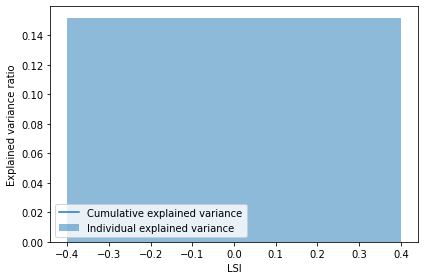

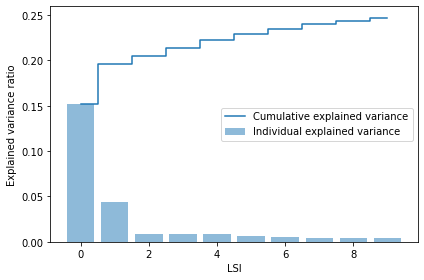

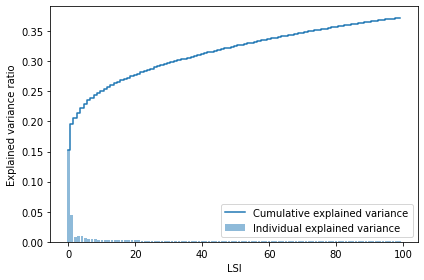

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import STOPWORDS
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Split data into train and test sets
train_size = int(len(tsdata) * 0.75)
df_train = tsdata[:train_size]
df_test= tsdata[train_size:]

stop_words = ["a", "b", "c", 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z'] + list(STOPWORDS)
# Vectorize tweet text
cv = CountVectorizer(stop_words=stop_words,min_df=5)
X_train = cv.fit_transform(df_train['Tweet_text'])
X_test = cv.transform(df_test['Tweet_text'])

tfidf_trans = TfidfTransformer(use_idf=True)

train_tfidf = tfidf_trans.fit_transform(X_train) # making the tfidf train matrix
print("Shape of TF-IDF train matrix: ", train_tfidf.shape)

test_tfidf = tfidf_trans.transform(X_test) # transforming the test data into the tfidf test matrix
print("Shape of TF-IDF test matrix: ", test_tfidf.shape)

#latent semantic indexing
k=[1,10,100,200,500,1000,2000,50]
for i in k:
  LSI = TruncatedSVD(n_components=i, random_state=42)

  train_LSI = LSI.fit_transform(train_tfidf) # performing LSI on the tfidf train matrix
  test_LSI = LSI.transform(test_tfidf)

  exp_var_LSI = LSI.explained_variance_ratio_

  cum_sum_eigenvalues = np.cumsum(exp_var_LSI)
  #
  # Create the visualization plot
  import matplotlib.pyplot as plt
  plt.bar(range(0,len(exp_var_LSI)), exp_var_LSI, alpha=0.5, align='center', label='Individual explained variance')
  plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
  plt.ylabel('Explained variance ratio')
  plt.xlabel('LSI')
  plt.legend(loc='best')
  plt.tight_layout()
  plt.show()


# Train a logistic regression model to predict the winning team
y_train = np.where(df_train['total_home_score'] < df_train['total_away_score'], 0, 1)
y_test = np.where(df_test['total_home_score'] < df_test['total_away_score'], 0, 1)

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

lrmodel = LogisticRegression(penalty='none',random_state=42,max_iter=100000)
pred_lr_model = lrmodel.fit(train_LSI,y_train).predict(test_LSI)

# Train logistic regression model
# lrmodel = LogisticRegression()
# lrmodel.fit(train_tfidf,y_train)

# # Evaluate model on test set
# pred_y = lrmodel.predict(test_tfidf)
print(classification_report(y_test, pred_lr_model))


In [ ]:
from sklearn.metrics import auc, roc_curve, plot_roc_curve, plot_confusion_matrix, accuracy_score, recall_score, precision_score, f1_score

fig, ax = plt.subplots()
fpr, tpr, _ = roc_curve(y_test, pred_lr_model.decision_function(test_LSI))
plot_roc_curve(pred_lr_model, test_LSI, y_test, ax=ax, color='b',label="AUC: "+str(auc(fpr,tpr))) 
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.5)
plt.title('ROC characteristics for Logistic Classifier (w/o regularization)')
plt.show()

In [ ]:
print("Accuracy (Logistic Classifier - w/o regularization):", accuracy_score(y_test,pred_lr_model))
print("Recall (Logistic Classifier - w/o regularization):", recall_score(y_test,pred_lr_model))
print("Precision (Logistic Classifier - w/o regularization):", precision_score(y_test,pred_lr_model))
print("F1-Score (Logistic Classifier - w/o regularization):", f1_score(y_test,pred_lr_model))

In [ ]:
from sklearn.model_selection import GridSearchCV
clf_lr_l1 = LogisticRegression(penalty='l1',random_state=42,solver='liblinear',max_iter=100000)
param_grid = {'C': [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000,100000]}
grid_l1 = GridSearchCV(clf_lr_l1,param_grid,cv=5,scoring='accuracy')
grid_l1.fit(train_LSI,y_train)

pred_cv_lr_l1 = grid_l1.best_estimator_.predict(test_LSI)
print('Best Value of L1 Regularization Parameter:',grid_l1.best_params_['C']) 
for l, n in zip(param_grid['C'],grid_l1.cv_results_['mean_test_score']):
    print(f'L1 Reg. Param.: {l}\t',f'Avg. Validation Accuracy: {n}')

print("Accuracy (best logistic classifer with L1 regularization):", accuracy_score(y_test,pred_cv_lr_l1 ))
print("Recall (best logistic classifer with L1 regularization):", recall_score(y_test,pred_cv_lr_l1 ))
print("Precision (best logistic classifer with L1 regularization):", precision_score(y_test,pred_cv_lr_l1 ))
print("F1-Score (best logistic classifer with L1 regularization):", f1_score(y_test,pred_cv_lr_l1 ))

In [ ]:
clf_lr_l2 = LogisticRegression(penalty='l2',solver='liblinear',random_state=42)
grid_l2 = GridSearchCV(clf_lr_l2,param_grid,cv=5,scoring='accuracy')
grid_l2.fit(train_LSI,y_train)
pred_cv_lr_l2 = grid_l2.best_estimator_.predict(test_LSI)

print('Best Value of L2 Regularization Parameter:',grid_l2.best_params_['C']) 
for l, n in zip(param_grid['C'],grid_l2.cv_results_['mean_test_score']):
    print(f'L2 Reg. Param.: {l}\t',f'Avg. Validation Accuracy: {n}')

print("Accuracy (best logistic classifer with L2 regularization):", accuracy_score(y_test,pred_cv_lr_l2 ))
print("Recall (best logistic classifer with L2 regularization):", recall_score(y_test,pred_cv_lr_l2 ))
print("Precision (best logistic classifer with L2 regularization):", precision_score(y_test,pred_cv_lr_l2 ))
print("F1-Score (best logistic classifer with L2 regularization):", f1_score(y_test,pred_cv_lr_l2))

In [ ]:
plot_confusion_matrix(pred_cv_lr_l1, test_LSI, y_test,display_labels=['SEA:SeaHawks','NE:Patriots'])
plt.title('Logistic Regression :L1 regularisation')
plt.show()

In [ ]:
plot_confusion_matrix(pred_cv_lr_l2, test_LSI, y_test,display_labels=['SEA:SeaHawks','NE:Patriots'])
plt.title('Logistic Regression :L2 regularisation')
plt.show()

In [ ]:
fig, ax = plt.subplots()
fpr, tpr, _ = roc_curve(y_test, pred_cv_lr_l1.decision_function(test_LSI))
plot_roc_curve(pred_cv_lr_l1, test_LSI, y_test, ax=ax, color='b',label="AUC: "+str(auc(fpr,tpr))) 
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.5)
plt.title('ROC characteristics for Logistic Classifier (with L1 regularization)')
plt.show()

fig, ax = plt.subplots()
fpr, tpr, _ = roc_curve(y_test, pred_cv_lr_l2.decision_function(test_LSI))
plot_roc_curve(pred_cv_lr_l2, test_LSI, y_test, ax=ax, color='b',label="AUC: "+str(auc(fpr,tpr))) 
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.5)
plt.title('ROC characteristics for Logistic Classifier (with L2 regularization)')
plt.show()